In [1]:
import pandas as pd

In [2]:
from backtesting import Strategy
from backtesting.lib import crossover

C:\Users\antho\Anaconda3\lib\site-packages\backtesting\_plotting.py:44: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

In [3]:
from backtesting import Backtest

In [5]:
%matplotlib inline
import seaborn as sns
from Price_Data import hist_data

In [7]:
import matplotlib.pyplot as plt

In [16]:
btcusd = hist_data('Bitstamp')

C:\Users\antho\Anaconda3\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [17]:
btcusd.columns = ['Open']

In [18]:
ss = btcusd.resample('H')

In [19]:
op = ss.first().ffill()
hi = ss.max().ffill()
lo = ss.min().ffill()
cl = ss.last().ffill()

In [21]:
btcusd

,Open
Date,
2011-09-13 13:53:36,5.80
2011-09-13 13:53:44,5.83
2011-09-13 13:53:49,5.90
2011-09-13 13:53:54,6.00
2011-09-13 14:32:53,5.95
...,...
2019-12-12 23:58:18,7184.44
2019-12-12 23:58:20,7184.44
2019-12-12 23:59:05,7190.53


In [20]:
ohlc = op
ohlc.columns = ['Open']
ohlc['High'] = hi
ohlc['Low'] = lo
ohlc['Close'] = cl
ohlc

,Open,High,Low,Close
Date,,,,
2011-09-13 13:00:00,5.80,6.00,5.80,6.00
2011-09-13 14:00:00,5.95,5.95,5.76,5.76
2011-09-13 15:00:00,5.65,5.65,5.65,5.65
2011-09-13 16:00:00,5.65,5.65,5.65,5.65
2011-09-13 17:00:00,5.65,5.65,5.65,5.65
...,...,...,...,...
2019-12-12 19:00:00,7205.66,7218.00,7186.36,7193.66
2019-12-12 20:00:00,7205.14,7250.23,7195.00,7242.49
2019-12-12 21:00:00,7245.85,7253.68,7180.83,7194.57


In [22]:
class SmaCross(Strategy):
    
    n1 = 100
    n2 = 1000
    
    def init(self):
        # Precompute two moving averages
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
    
    def next(self):
        # If sma1 crosses above sma2, buy the asset
        if crossover(self.sma1, self.sma2):
            self.buy()

        # Else, if sma1 crosses below sma2, sell it
        elif crossover(self.sma2, self.sma1):
            self.sell()

In [23]:
def SMA(values,n):
    return pd.Series(values).rolling(n).mean()

In [24]:
bt = Backtest(ohlc,SmaCross,cash=10000)

In [25]:
bt.run()

Start                     2011-09-13 13:00:00
End                       2019-12-12 23:00:00
Duration                   3012 days 10:00:00
Exposure [%]                          96.7095
Equity Final [$]                       129180
Equity Peak [$]                        264906
Return [%]                             1191.8
Buy & Hold Return [%]                  119707
Max. Drawdown [%]                    -95.5564
Avg. Drawdown [%]                     -6.0083
Max. Drawdown Duration     1693 days 16:00:00
Avg. Drawdown Duration       26 days 22:00:00
# Trades                                   93
Win Rate [%]                          38.7097
Best Trade [%]                        527.639
Worst Trade [%]                      -87.0544
Avg. Trade [%]                         14.384
Max. Trade Duration         150 days 18:00:00
Avg. Trade Duration          31 days 08:00:00
Expectancy [%]                        28.7179
SQN                                  0.638904
Sharpe Ratio                      

In [27]:
bt.plot()

In [28]:
data, heat = bt.optimize('Sharpe Ratio',n1=range(1,200,9),n2=range(1,200,9),constraint=lambda p: p.n1<p.n2,return_heatmap=True)

In [29]:
data

Start                         2011-09-13 13:00:00
End                           2019-12-12 23:00:00
Duration                       3012 days 10:00:00
Exposure [%]                              99.6943
Equity Final [$]                      2.89105e+08
Equity Peak [$]                       7.73263e+08
Return [%]                            2.89095e+06
Buy & Hold Return [%]                      119707
Max. Drawdown [%]                        -85.9683
Avg. Drawdown [%]                         -4.5924
Max. Drawdown Duration          453 days 04:00:00
Avg. Drawdown Duration            6 days 11:00:00
# Trades                                      485
Win Rate [%]                              44.5361
Best Trade [%]                            369.563
Worst Trade [%]                            -24.82
Avg. Trade [%]                            3.23692
Max. Trade Duration              44 days 09:00:00
Avg. Trade Duration               6 days 05:00:00
Expectancy [%]                             7.5375


In [30]:
heat.sort_values()
hmap = heat.groupby(['n1','n2']).mean().unstack()
hmap

n2,10,19,28,37,46,55,64,73,82,91,...,118,127,136,145,154,163,172,181,190,199
n1,,,,,,,,,,,,,,,,,,,,,
1,0.000648,0.007836,0.020575,0.027159,0.027821,0.020435,0.019029,0.016916,0.008088,0.016648,...,0.023768,0.028900,0.024953,0.026101,0.024392,0.024030,0.031286,0.031624,0.032594,0.029765
10,NaN,0.024508,0.080627,0.076144,0.079331,0.077830,0.085892,0.093654,0.095111,0.103984,...,0.105649,0.113958,0.097354,0.101935,0.110080,0.118393,0.124752,0.120165,0.120010,0.077769
19,NaN,NaN,0.098193,0.102795,0.116352,0.107802,0.121085,0.125592,0.130104,0.126663,...,0.103754,0.106787,0.113309,0.133316,0.124782,0.128698,0.128307,0.128787,0.093243,0.095027
28,NaN,NaN,NaN,0.052397,0.063937,0.063579,0.087816,0.102372,0.123373,0.124505,...,0.090358,0.088811,0.105681,0.119848,0.116054,0.123518,0.130946,0.133884,0.119269,0.100185
37,NaN,NaN,NaN,NaN,0.040275,0.075971,0.097725,0.098856,0.111797,0.137876,...,0.097546,0.102138,0.108743,0.125177,0.124615,0.116257,0.123283,0.130175,0.127629,0.109915
46,NaN,NaN,NaN,NaN,NaN,0.066578,0.093587,0.097615,0.095212,0.140611,...,0.102103,0.097820,0.101518,0.116091,0.113676,0.108273,0.116473,0.127712,0.130228,0.112286
55,NaN,NaN,NaN,NaN,NaN,NaN,0.054854,0.082491,0.094908,0.114679,...,0.097290,0.108891,0.104201,0.109976,0.119228,0.106487,0.120720,0.125231,0.133406,0.128863
64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.067746,0.071833,0.076778,...,0.091023,0.087245,0.095535,0.108079,0.114373,0.103347,0.115256,0.123594,0.119654,0.128673
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.058234,0.065267,...,0.095056,0.087974,0.111072,0.106158,0.116380,0.114302,0.113104,0.120825,0.110105,0.110229


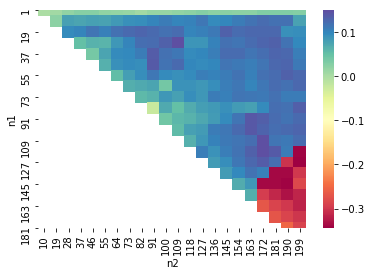

In [31]:
sns.heatmap(hmap, cmap='Spectral')

In [32]:
tr = hmap.stack()

In [33]:
n1 = [i[0] for i in tr.index]
n2 = [i[1] for i in tr.index]

In [34]:
val = []
for (i,j) in zip(n1,n2):
    if i<j:
        val.append(tr.loc[i,j])

In [36]:
import scipy.interpolate as interp
import numpy as np

px, py = np.meshgrid(np.linspace(np.min(n1),np.max(n1),100),np.linspace(np.min(n2),np.max(n2),100))
pz = interp.griddata((n1,n2),val,(px,py),method='linear')

C:\Users\antho\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  
C:\Users\antho\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


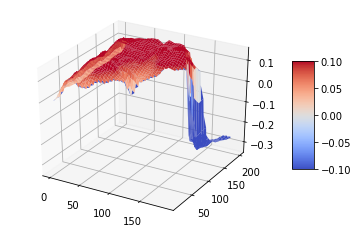

In [37]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(px,py,pz,cmap=cm.coolwarm)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()